# Problem Set 5 CS129.18

## Requirements


>Geospatial Analytics is a domain heavily used in corporate and business data science. It's used for demand-forecasting, real-estate prediction, population estimation, and optimal route planning..

Using the lessons on DBSCAN, and the other resource notebooks, show the following in this Jupyter Notebook.

Write your answers down as Markdown cells or comments in the code.

---

Using your own API keys, scrape a class of location in Foursquare, and answer the guide questions as follows. Just replace coffee shop with the type of location you guys used.

---

1. What are the top 3 most common <place you chose>? ( 1pt )

2. What is the latitude variance and longitude variance, and explain why these variances are different. ( 3pts )

3. Explain what KMeans intertia is and how different it is from DBSCAN epsilon. ( 4pts )

4. Cluster the locations data with DBSCAN. ( 5pts )

5. Present an analysis of the data following the DBSCAN results. ( 7pts )
 - explain what the clusters mean
 - what does the # of clusters tell us
 - what is this information useful for





-----


Bonus 1 : What is your favorite coffee shop? (1pt)


Bonus 2 : Run everything on your own geospatial dataset, and answer the same questions listed above. (5pts)
Use this: https://developer.foursquare.com/docs/resources/categories
 
----

**Submit this file on Moodle on the submission link I will provide. This is due October 25 12nn.**

In [390]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from scipy.spatial import Voronoi, voronoi_plot_2d
import folium
from folium import plugins
from folium.plugins import MarkerCluster
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import foursquare
import json

# Make the graphs a bit prettier, and bigger
# pd.set_option('display.mpl_style', 'default')
plt.style.use('ggplot')

# This is necessary to show lots of columns in pandas 0.12. 
# Not necessary in pandas 0.13.
pd.set_option('display.width', 5000) 
pd.set_option('display.max_columns', 60)

plt.rcParams['figure.figsize'] = (15, 5)

In [152]:
# Import long an/d lat of prominent cities (based on population) https://simplemaps.com/data/ph-cities
with open('data/ph.json') as f:
    cities = json.loads(f.read())

centroids = []
    
for city in cities:
    lat = city["lat"]
    lng = city["lng"]
    lat_lng = f'{lat}, {lng}'
    centroids.append(lat_lng)

In [171]:
df_cities = pd.read_json(r'data/ph.json')
df_cities["city"] = df_cities['city'].str.lower()

In [172]:
df_cities

,city,lat,lng,country,iso2,admin_name,capital,population,population_proper
0,manila,14.5958,120.9772,Philippines,PH,Manila,primary,23088000,1780148
1,quezon city,14.6333,121.0333,Philippines,PH,Quezon,admin,2936116,2936116
2,davao,7.0667,125.6000,Philippines,PH,Davao,admin,1632991,1632991
3,caloocan city,14.6500,120.9667,Philippines,PH,Caloocan,admin,1583978,1583978
4,cebu city,10.3000,123.9000,Philippines,PH,Cebu,admin,922611,922611
...,...,...,...,...,...,...,...,...,...
159,banaybanay,6.9623,126.0172,Philippines,PH,Davao Oriental,minor,,
160,president quirino,6.7253,124.7382,Philippines,PH,Sultan Kudarat,minor,,
161,corella,9.6896,123.9197,Philippines,PH,Bohol,minor,,
162,madridejos,9.7912,123.3462,Philippines,PH,Cebu,minor,,


In [3]:
print(centroids)

['14.5958, 120.9772', '14.6333, 121.0333', '7.0667, 125.6000', '14.6500, 120.9667', '10.3000, 123.9000', '6.9167, 122.0833', '14.5167, 121.0500', '14.5842, 121.1763', '14.5750, 121.0833', '8.4833, 124.6500', '14.4667, 121.0167', '14.3294, 120.9367', '14.7000, 120.9833', '14.4624, 120.9645', '6.1167, 125.1667', '14.4500, 120.9833', '14.5500, 121.0333', '14.8139, 121.0453', '10.6765, 122.9509', '14.3833, 121.0500', '14.2167, 121.1667', '14.6500, 121.1000', '10.7167, 122.5667', '14.5500, 121.0000', '15.1472, 120.5847', '10.3150, 123.9761', '14.4297, 120.9367', '14.5833, 121.0333', '14.6625, 120.9567', '10.3333, 123.9333', '14.3167, 121.1167', '16.4152, 120.5956', '8.2333, 124.2500', '15.4802, 120.5979', '8.9534, 125.5288', '14.3333, 121.0833', '13.9411, 121.1622', '13.7500, 121.0500', '14.3583, 121.0583', '14.3833, 120.8833', '14.2750, 121.1250', '15.0333, 120.6833', '15.4833, 120.9667', '7.2167, 124.2500', '10.9587, 123.3086', '13.9333, 121.6167', '14.0667, 121.3167', '7.4478, 125.8078',

In [37]:
topics = ["hospital", "clinic", "lab", "vet", "eye", "heart", "acupuncture", "chiropractor", "dog", "cat"]

In [38]:
# Construct the client object
client = foursquare.Foursquare(client_id='FQK4HMAPQRGCUHAW4FVZKEETJYBJ31ZPLPDZAKPM2QB4CLEE', 
                               client_secret='NW1BHTKWWAXS3OACZQTKN3Q1BAAUYPPDYPPI0T5DKFY2NCZ3', 
                               redirect_uri='http://fondu.com/oauth/authorize')

# Build the authorization url for your app
auth_uri = client.oauth.auth_url()

In [39]:
response = [client.venues.search(params={'query': topic, 
                                         'll': place,
                                        'radius': 2000, #2km around centroid
                                        'limit': 20, 
                                        'intent': "browse", 
                                        'categoryId': '4bf58dd8d48988d104941735'})
            for place in centroids for topic in topics]

In [338]:
data_list = []
for x in range(len(response)):
    try:
        for i in range(len(response[x]["venues"])):
            poi_id =  response[x]["venues"][i]["id"]
            poi_name =  response[x]["venues"][i]["name"]
            poi_lat =  response[x]["venues"][i]["location"]["lat"]
            poi_lng =  response[x]["venues"][i]["location"]["lng"]
            poi_city = response[x]["venues"][i]["location"]["state"]
            poi_cat = response[x]["venues"][i]["categories"][0]["name"]
            data_list.append([poi_id, poi_name, poi_lat, poi_lng, poi_city, poi_cat])
    except KeyError:
        pass

df = pd.DataFrame(data_list, columns=["id", "name", "lat", "lng", "city", "cat"])
df = df.drop_duplicates()
df["name"] = df['name'].str.lower()
df["city"] = df['city'].str.lower()
df["cat"] = df['cat'].str.lower()

In [339]:
df.to_csv("data/medfaci_v2.csv")

In [365]:
df = pd.read_csv("data/medfaci.csv")

In [366]:
df

,Unnamed: 0,id,name,lat,lng,cat
0,0,4e4bf6d2fa7671a85cf09608,justice jose abad santos general hospital,14.597364,120.971982,Hospital
1,1,4f8b7638e4b047d84bff23f4,american hospital,14.592835,120.973255,Hospital
2,2,4efe49e793adc824574c65d1,justice jose abad santos general hospital,14.597477,120.972110,Hospital
3,3,4d8bf9bd84f56ea895a94397,amosup seamen's hospital,14.587547,120.977390,Hospital
4,4,5b35d20210b3030024d3946c,amosup seamen's hospital - nuclear medicine,14.587415,120.977196,Medical Center
...,...,...,...,...,...,...
3436,3687,557239d3498e875ed2d7dcb6,magalang medical laboratory,15.213035,120.659442,Medical Lab
3437,3688,5158e1cde4b06ee01a654a80,kabasalan general hospital,7.795887,122.762276,Hospital
3438,3689,5275203a498efd84c4510e00,pathfinder estate hospital,7.794023,122.763952,Medical Center
3439,3690,5293aac111d2bb1124b8fbc4,padre burgos community hospital,10.025800,125.018000,Medical Center


#### 1. What are the top 3 most common medical facilities? ( 1pt )
---
The top 3 medical facilities are hospitals, dentist's offices, and doctor's offices

<AxesSubplot:title={'center':'Top 15 Medical Facilities'}>

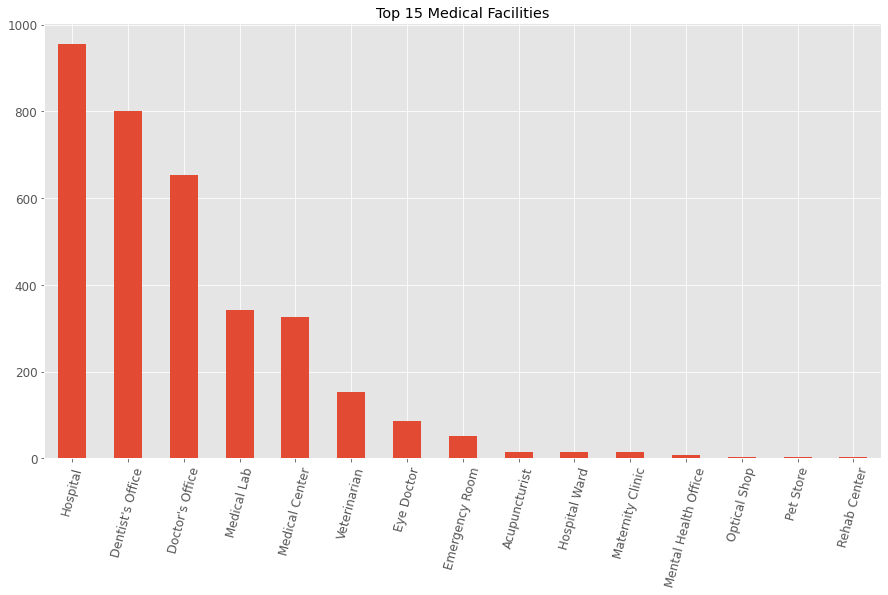

In [367]:
fig, ax = plt.subplots()
df['cat'].value_counts().head(15).plot(ax=ax, kind='bar', \
                                        title ="Top 15 Medical Facilities",figsize=(15,8), fontsize=12, rot=75)

#### 2. What is the latitude variance and longitude variance, and explain why these variances are different. ( 3pts )
---
The difference in the variances is due to the geographic coordinates of the Philippines. Approximately, the latitude and longitude of the Philippines span from 5-20°(N) and 120-125°(E), respectively. Given this, points of interest are more likely to be insterpersed along the latitude than the longitude.

In [368]:
df.var()[['lat','lng']]

lat    9.142997
lng    2.969507
dtype: float64

#### 3. Explain what KMeans intertia is and how different it is from DBSCAN epsilon. ( 4pts )
---
We can think of KMeans inertia as a "line" that gives the distance between the points of a cluster and its centroid. Meanwhile, DBSCAN epsilon adjusts the "area" of a point to determine whether other points are close enough to be clumped into a single cluster. 

#### 4. Cluster the locations data with DBSCAN. ( 5pts )
---

In [369]:
# Folium as a mapping tool centered at location, 
basemap = folium.Map(location=[12.8797,121.7740], tiles="cartodbdark_matter", zoom_start=5)

marker_cluster = MarkerCluster(
    overlay=True,
    control=False,
    icon_create_function=None
)

# Loop through datafram and group by clusters
for index, row in df.iterrows():
    marker = folium.Marker(location=[row["lat"], row["lng"]])
    
    popup_str = f'''Name: {row["name"]} | 
                    Cat: {row["cat"]} | 
                    Lat: {row["lat"]} | 
                    Long: {row["lng"]}'''
    
    folium.Popup(popup_str).add_to(marker)
    marker_cluster.add_child(marker)
    
marker_cluster.add_to(basemap)
    
# Map of medical facilities in the prominent cities (based on population) of the Philippines.
basemap 

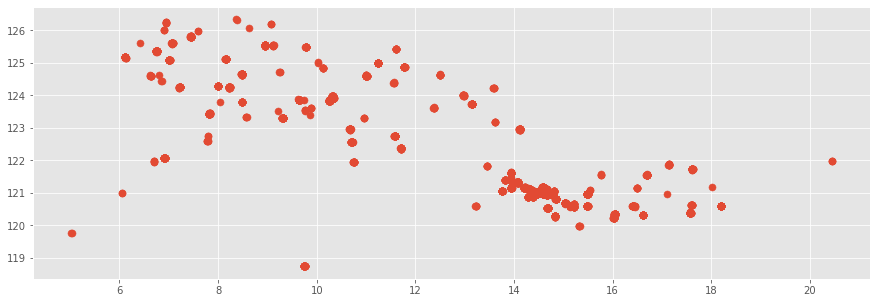

In [370]:
X = np.array(df[["lat", "lng"]].values.tolist())
plt.scatter(X[:, 0], X[:, 1], s=50)

In [371]:
# eps = 0.005 since geospatial data
dbscan = DBSCAN(eps=0.005, min_samples=5).fit(X)
y_dbscan = dbscan.labels_

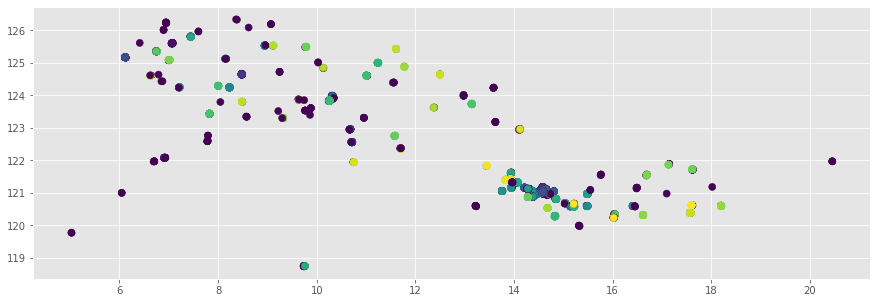

In [372]:
plt.scatter(X[:, 0], X[:, 1], c=y_dbscan, s=50)

In [373]:
df["dbscan_cluster"] = y_dbscan
palette = sns.color_palette("pastel", len(y_dbscan)).as_hex()
color_getter = lambda x: palette[int(x)]
df["db_color"] = df["dbscan_cluster"].map(color_getter)
df.head()

,Unnamed: 0,id,name,lat,lng,cat,dbscan_cluster,db_color
0,0,4e4bf6d2fa7671a85cf09608,justice jose abad santos general hospital,14.597364,120.971982,Hospital,0,#a1c9f4
1,1,4f8b7638e4b047d84bff23f4,american hospital,14.592835,120.973255,Hospital,0,#a1c9f4
2,2,4efe49e793adc824574c65d1,justice jose abad santos general hospital,14.597477,120.972110,Hospital,0,#a1c9f4
3,3,4d8bf9bd84f56ea895a94397,amosup seamen's hospital,14.587547,120.977390,Hospital,0,#a1c9f4
4,4,5b35d20210b3030024d3946c,amosup seamen's hospital - nuclear medicine,14.587415,120.977196,Medical Center,0,#a1c9f4


In [374]:
df = df[df["dbscan_cluster"] > -1]

In [375]:
basemap = folium.Map(location=[12.8797,121.7740], tiles="cartodbdark_matter", zoom_start=5)

for index, row in df.iterrows():
    popup_str = f'''Name: {row["name"]} | 
                    Cat: {row["cat"]} | 
                    Cluster: {row["dbscan_cluster"]} | 
                    Lat: {row["lat"]} | 
                    Long: {row["lng"]}'''

    folium.CircleMarker([row["lat"], row["lng"]], radius=5,
    fill=True,
    color =row["db_color"],
    popup = folium.Popup(popup_str, parse_html=True),
    fill_color=row["db_color"]).add_to(basemap)
    
basemap

In [353]:
print(f'Number of clusters: {df["dbscan_cluster"].nunique()}')

Number of clusters: 124


### 5. Present an analysis of the data following the DBSCAN results. ( 7pts )
 - explain what the clusters mean
 - what does the # of clusters tell us
 - what is this information useful for
---

1. The clusters represent medical facilities (including hospitals, dentist's clinics, veterinarians, etc.) in an area.

2. Comparing the number of cities (164) fed to the Foursquare API with the number of clusters (124), we can assume that DBSCAN tried to cluster the medical facilties by city. The concentration of medical facilities in urban areas may be due to the population in that particular area.

3. This information could be useful for determining which areas are lacking in medical facilities. In this case, we considered all medical facilities, but we could specify which facilities are relevant to us (e.g. Hospitals only) and perhaps include all of the cities in the Philippines. Currently, we can see that medical facilities are condensed in metropolitan areas (Metro Manila, Metro Davao, and Metro Cebu).

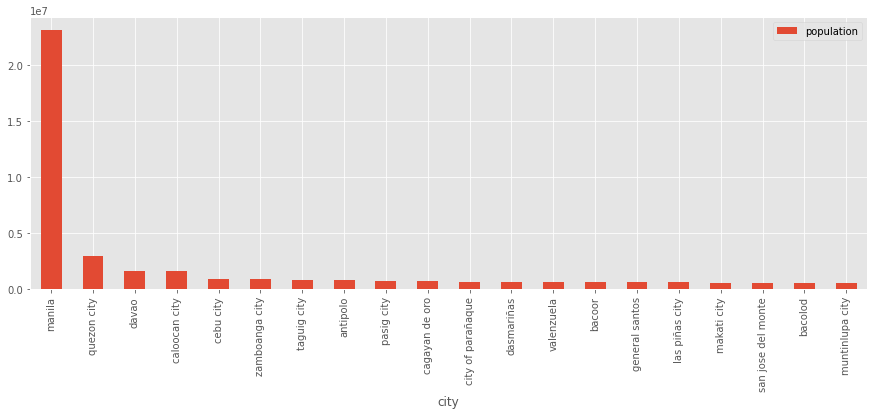

In [283]:
df_cities["population"] = pd.to_numeric(df_cities["population"])

ax = df_cities.head(20).plot.bar(x='city',y="population")

### Hospitals only
---

In [376]:
df_hospitals= df.copy()

In [377]:
df_hospitals= df[df['cat'] == "Hospital"]

In [378]:
df_hospitals

,Unnamed: 0,id,name,lat,lng,cat,dbscan_cluster,db_color
0,0,4e4bf6d2fa7671a85cf09608,justice jose abad santos general hospital,14.597364,120.971982,Hospital,0,#a1c9f4
1,1,4f8b7638e4b047d84bff23f4,american hospital,14.592835,120.973255,Hospital,0,#a1c9f4
2,2,4efe49e793adc824574c65d1,justice jose abad santos general hospital,14.597477,120.972110,Hospital,0,#a1c9f4
3,3,4d8bf9bd84f56ea895a94397,amosup seamen's hospital,14.587547,120.977390,Hospital,0,#a1c9f4
5,5,4c9715daf6c8ef3bb36886cf,manila doctors hospital,14.582477,120.982448,Hospital,1,#ffb482
...,...,...,...,...,...,...,...,...
3381,3628,4fec10b2e4b07d3697138d1b,lingayen district hospital,16.017787,120.230456,Hospital,122,#8de5a1
3382,3629,4ff81f41e4b0e8d00de812b8,jesus nazarene general hospital,16.014658,120.232056,Hospital,122,#8de5a1
3383,3630,5347588b498eae8a33ca9939,jesus nazarene general hospital,16.014573,120.235189,Hospital,122,#8de5a1
3395,3643,56f0a5b7498e6f85e6ed07c1,governor celestino gallares memorial hospital,9.638930,123.862225,Hospital,104,#d0bbff


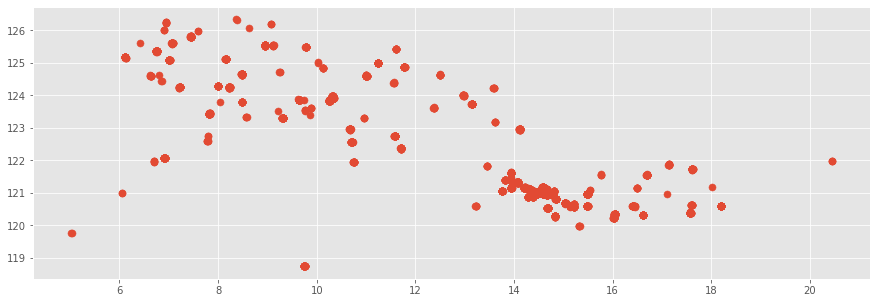

In [379]:
X_hospitals = np.array(df_hospitals[["lat", "lng"]].values.tolist())
plt.scatter(X[:, 0], X[:, 1], s=50)

In [380]:
# eps = 0.005 since geospatial data
dbscan_hospitals = DBSCAN(eps=0.005, min_samples=5).fit(X_hospitals)
y_dbscan_hospitals = dbscan_hospitals.labels_

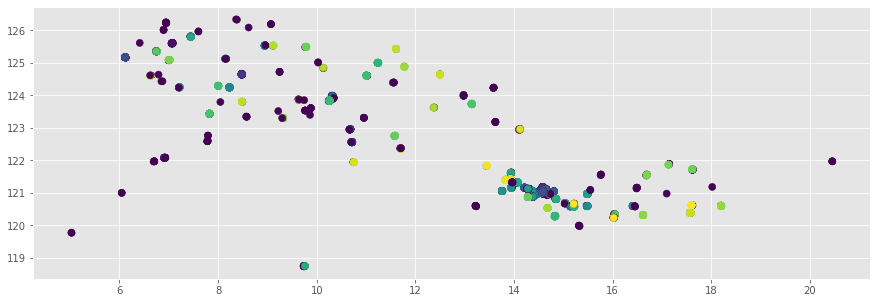

In [381]:
plt.scatter(X[:, 0], X[:, 1], c=y_dbscan, s=50)

In [382]:
df_hospitals["dbscan_cluster"] = y_dbscan_hospitals
palette = sns.color_palette("pastel", len(y_dbscan_hospitals)).as_hex()
color_getter = lambda x: palette[int(x)]
df_hospitals["db_color"] = df_hospitals["dbscan_cluster"].map(color_getter)
df_hospitals.head()

<ipython-input-382-aba05a894d5f>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_hospitals["dbscan_cluster"] = y_dbscan_hospitals
<ipython-input-382-aba05a894d5f>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_hospitals["db_color"] = df_hospitals["dbscan_cluster"].map(color_getter)


,Unnamed: 0,id,name,lat,lng,cat,dbscan_cluster,db_color
0,0,4e4bf6d2fa7671a85cf09608,justice jose abad santos general hospital,14.597364,120.971982,Hospital,-1,#b9f2f0
1,1,4f8b7638e4b047d84bff23f4,american hospital,14.592835,120.973255,Hospital,-1,#b9f2f0
2,2,4efe49e793adc824574c65d1,justice jose abad santos general hospital,14.597477,120.972110,Hospital,-1,#b9f2f0
3,3,4d8bf9bd84f56ea895a94397,amosup seamen's hospital,14.587547,120.977390,Hospital,0,#a1c9f4
5,5,4c9715daf6c8ef3bb36886cf,manila doctors hospital,14.582477,120.982448,Hospital,1,#ffb482


In [383]:
# Remove outliers
df_hospitals = df_hospitals[df_hospitals["dbscan_cluster"] > -1]

In [384]:
basemap = folium.Map(location=[12.8797,121.7740], tiles="cartodbdark_matter", zoom_start=5)

for index, row in df_hospitals.iterrows():
    popup_str = f'''Name: {row["name"]} | 
                    Cat: {row["cat"]} | 
                    Cluster: {row["dbscan_cluster"]} | 
                    Lat: {row["lat"]} | 
                    Long: {row["lng"]}'''

    folium.CircleMarker([row["lat"], row["lng"]], radius=5,
    fill=True,
    color =row["db_color"],
    popup = folium.Popup(popup_str, parse_html=True),
    fill_color=row["db_color"]).add_to(basemap)
    
basemap

In [385]:
print(f'Number of clusters: {df_hospitals["dbscan_cluster"].nunique()}')

Number of clusters: 53
